# **Image Colorization Using GANs**


# Importing Libraries

In [38]:
import numpy as np
import h5py
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import cv2
from tensorflow.keras.layers import Input,Dense,Reshape,Conv2D,Dropout,multiply,Dot,Concatenate,subtract,ZeroPadding2D
from tensorflow.keras.layers import BatchNormalization,LeakyReLU,Flatten
from tensorflow.keras.layers import Conv2DTranspose as Deconv2d
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# from google.colab import files
from keras import backend as K
import smtplib

from sklearn.utils import shuffle

In [39]:
import tensorflow as tf
import keras
from keras import layers
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
from tqdm import tqdm
import re
from tensorflow.keras.utils import img_to_array

# Uploading Dataset

In [40]:
# to get the files in proper order
def sorted_alphanumeric(data):
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)
# defining the size of the image
SIZE = 256
color_img = []
path = '/kaggle/input/landscape-image-colorization/landscape Images/color'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
        if i == '2200.jpg':
            break
        else:
            img = cv2.imread(path + '/'+i,1)
            # open cv reads images in BGR format so we have to convert it to RGB
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            #resizing image
            img = cv2.resize(img, (SIZE, SIZE))
            img = img.astype('float32') / 255.0
            color_img.append(img_to_array(img))


gray_img = []
path = '/kaggle/input/landscape-image-colorization/landscape Images/gray'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
         if i == '2200.jpg':
            break
         else:
            img = cv2.imread(path + '/'+i,1)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            #resizing image
            img = cv2.resize(img, (SIZE, SIZE))
            img = img.astype('float32') / 255.0
            gray_img.append(img_to_array(img))

 31%|███       | 2200/7129 [00:03<00:08, 613.27it/s]


# Show Images

In [42]:
color_dataset=tf.data.Dataset.from_tensor_slices(np.array(color_img[:2000])).batch(64)
gray_dataset=tf.data.Dataset.from_tensor_slices(np.array(gray_img[:2000])).batch(64)

color_dataset_t=tf.data.Dataset.from_tensor_slices(np.array(color_img[2000:])).batch(8)
gray_dataset_t=tf.data.Dataset.from_tensor_slices(np.array(gray_img[2000:])).batch(8)

example_color = next(iter(color_dataset))
example_gray = next(iter(gray_dataset))

In [43]:
example_color = next(iter(color_dataset)) 
example_gray = next(iter(gray_dataset))

In [44]:
def plot_images(a = 4):

    for i in range(a):
        plt.figure(figsize = (10,10))
        plt.subplot(121)
        plt.title('color')
        plt.imshow(example_color[i] )

        plt.subplot(122)
        plt.title('gray')
        plt.imshow(example_gray[i])
        plt.show()

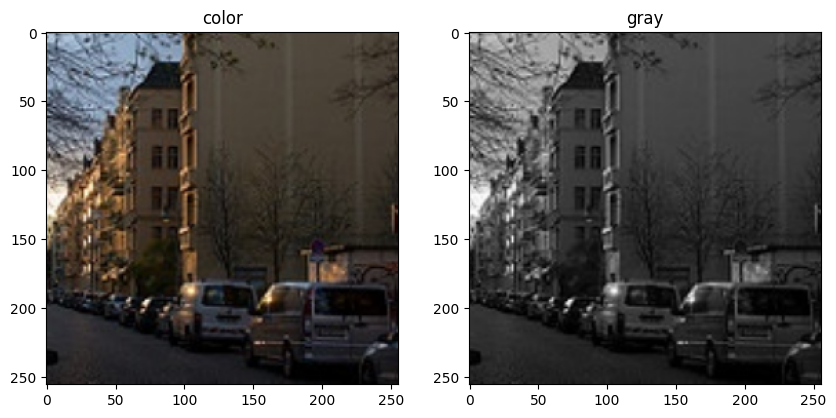

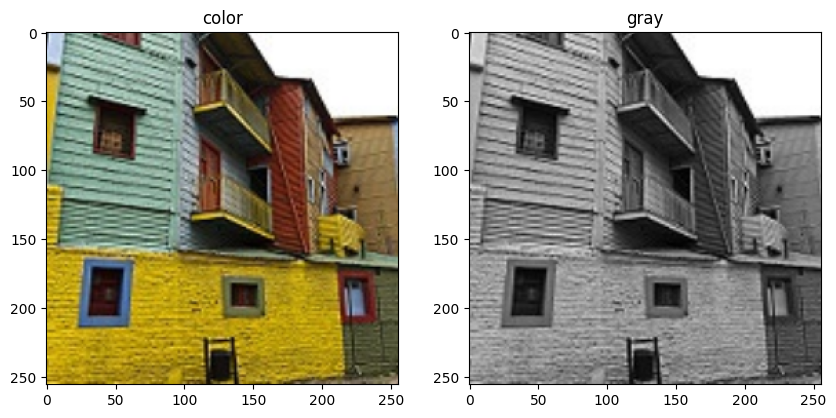

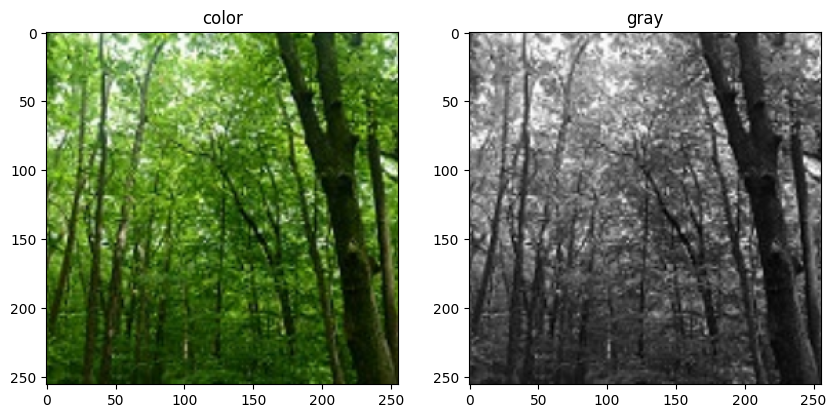

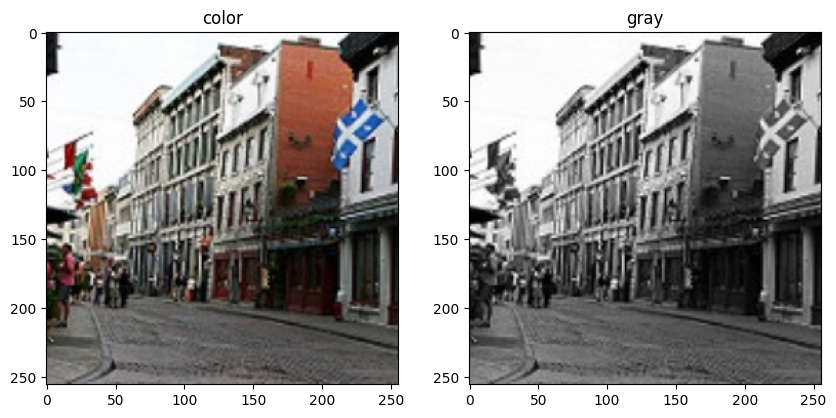

In [45]:
plot_images(4)

# Modeling

In [46]:
def downsample(filters, size, apply_batchnorm=True):

  result = tf.keras.Sequential()
  result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',kernel_initializer='he_normal', use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())
  return result

def upsample(filters, size, apply_dropout=False):

  result = tf.keras.Sequential()
  result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2,padding='same',kernel_initializer='he_normal',use_bias=False))
  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())
  return result

# Generator

In [47]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[256,256,3])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False), # (bs, 128, 128, 64)
    downsample(128, 4), # (bs, 64, 64, 128)
    downsample(256, 4), # (bs, 32, 32, 256)
    downsample(512, 4), # (bs, 16, 16, 512)
    downsample(512, 4), # (bs, 8, 8, 512)
    downsample(512, 4), # (bs, 4, 4, 512)
    downsample(512, 4), # (bs, 2, 2, 512)
    downsample(512, 4), # (bs, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True), # (bs, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True), # (bs, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True), # (bs, 8, 8, 1024)
    upsample(512, 4), # (bs, 16, 16, 1024)
    upsample(256, 4), # (bs, 32, 32, 512)
    upsample(128, 4), # (bs, 64, 64, 256)
    upsample(64, 4), # (bs, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(3, 4,strides=2,padding='same',kernel_initializer=initializer,activation='tanh') # (bs, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

# Discriminator

In [48]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar]) # (bs, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
  down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
  down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1) # (bs, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

In [49]:
generator = Generator()
generator.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 sequential_36 (Sequential)     (None, 128, 128, 64  3072        ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 sequential_37 (Sequential)     (None, 64, 64, 128)  131584      ['sequential_36[0][0]']          
                                                                                            

In [50]:
discriminator = Discriminator()
discriminator.summary()

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_image (InputLayer)       [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 target_image (InputLayer)      [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 concatenate_23 (Concatenate)   (None, 256, 256, 6)  0           ['input_image[0][0]',            
                                                                  'target_image[0][0]']     

# Check Loss 

In [51]:
genLoss=[]
discLoss=[]

In [52]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

LAMBDA = 100

def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)
  genLoss.append(total_gen_loss)

  return total_gen_loss, gan_loss, l1_loss

def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss
  discLoss.append(total_disc_loss)

  return total_disc_loss

# Training Method

In [53]:
def train_step(input_image, target, epoch):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

# Fitting Method

In [54]:
import time
def fit(train_ds, epochs,):
  for epoch in range(epochs):
    start = time.time()
    print("Epoch: ", epoch+1)
    # Train
    for n, (input_image, target) in train_ds.enumerate():
      train_step(input_image, target, epoch)
    print()
    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,time.time()-start))

# Generating Code

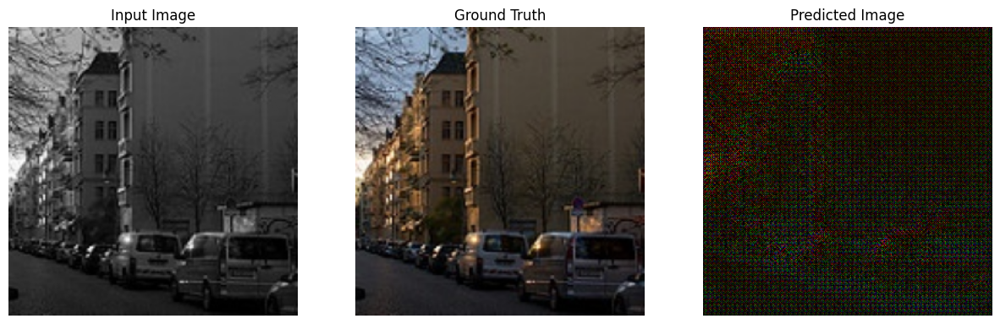

(64, 256, 256, 3)


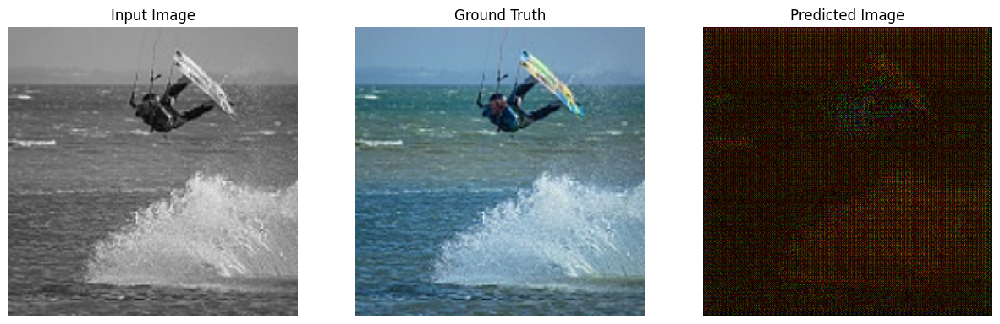

(64, 256, 256, 3)


In [55]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15,15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i])
    plt.axis('off')
  plt.show()

for example_input, example_target in tf.data.Dataset.zip((gray_dataset,color_dataset)).take(2):
  generate_images(generator, example_input, example_target)
  print(example_input.shape)

# Fitting in 50 epochs

In [56]:
hist=fit(tf.data.Dataset.zip((gray_dataset, color_dataset)), epochs = 50)

Epoch:  1

Time taken for epoch 1 is 50.34643912315369 sec

Epoch:  2

Time taken for epoch 2 is 43.17576861381531 sec

Epoch:  3

Time taken for epoch 3 is 43.194941997528076 sec

Epoch:  4

Time taken for epoch 4 is 43.185784339904785 sec

Epoch:  5

Time taken for epoch 5 is 43.188429832458496 sec

Epoch:  6

Time taken for epoch 6 is 43.192786693573 sec

Epoch:  7

Time taken for epoch 7 is 43.18739461898804 sec

Epoch:  8

Time taken for epoch 8 is 43.19640779495239 sec

Epoch:  9

Time taken for epoch 9 is 43.19347381591797 sec

Epoch:  10

Time taken for epoch 10 is 43.29664087295532 sec

Epoch:  11

Time taken for epoch 11 is 43.29260325431824 sec

Epoch:  12

Time taken for epoch 12 is 43.2163188457489 sec

Epoch:  13

Time taken for epoch 13 is 43.25581884384155 sec

Epoch:  14

Time taken for epoch 14 is 43.21525430679321 sec

Epoch:  15

Time taken for epoch 15 is 43.165380001068115 sec

Epoch:  16

Time taken for epoch 16 is 43.15253019332886 sec

Epoch:  17

Time taken fo

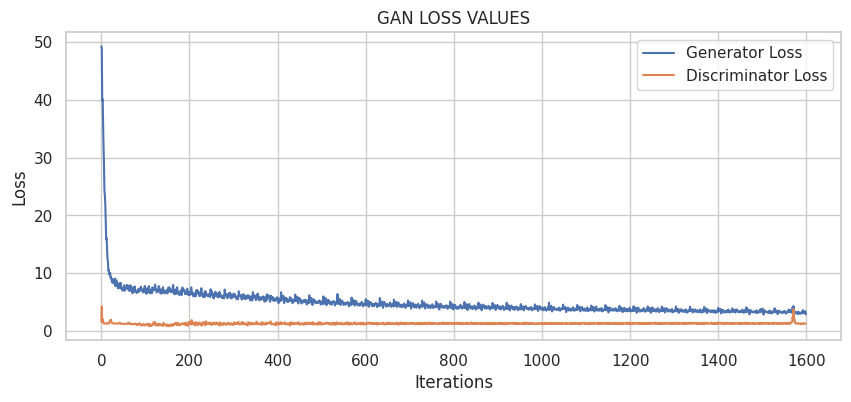

In [57]:
import seaborn as sns
sns.set(style='whitegrid')
plt.figure(figsize=(10,4))
plt.plot(genLoss, label="Generator Loss")
plt.plot(discLoss, label="Discriminator Loss")
plt.title("GAN LOSS VALUES")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

# Fitting with good results

(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


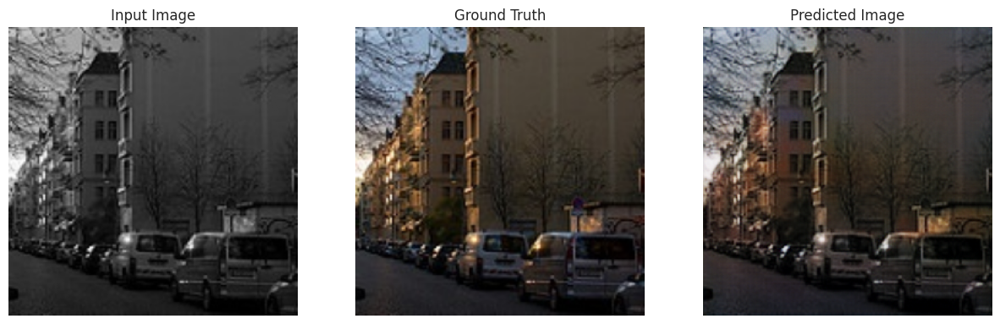

(64, 256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


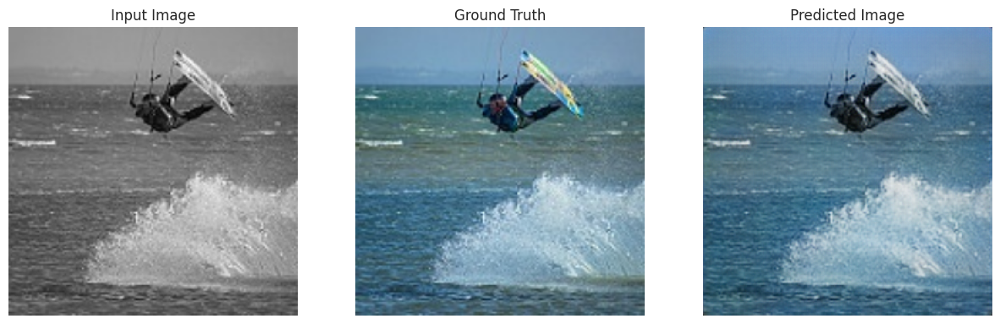

(64, 256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


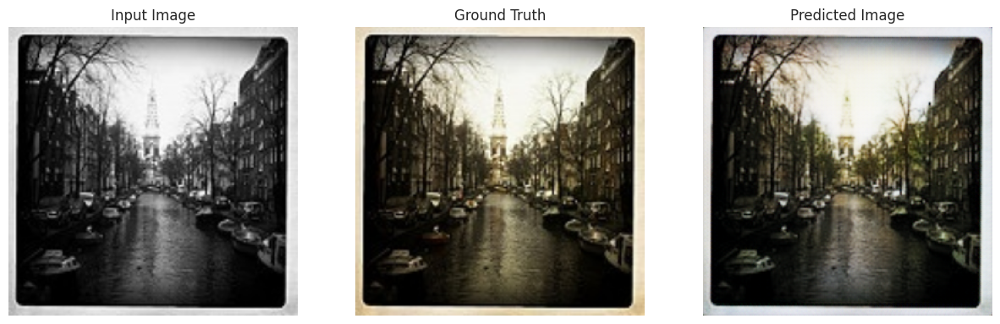

(64, 256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


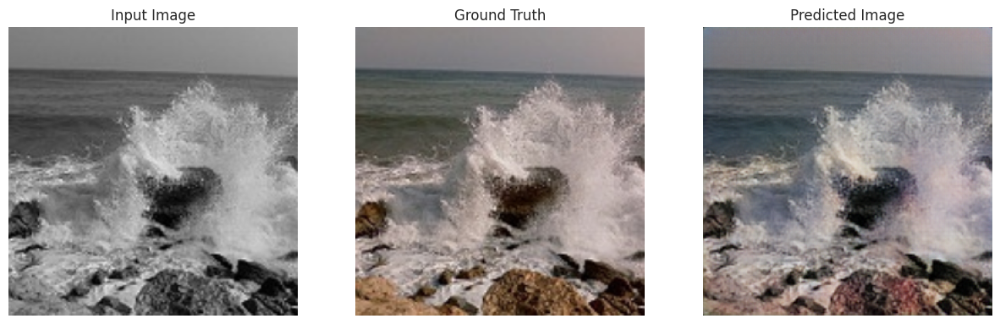

(64, 256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


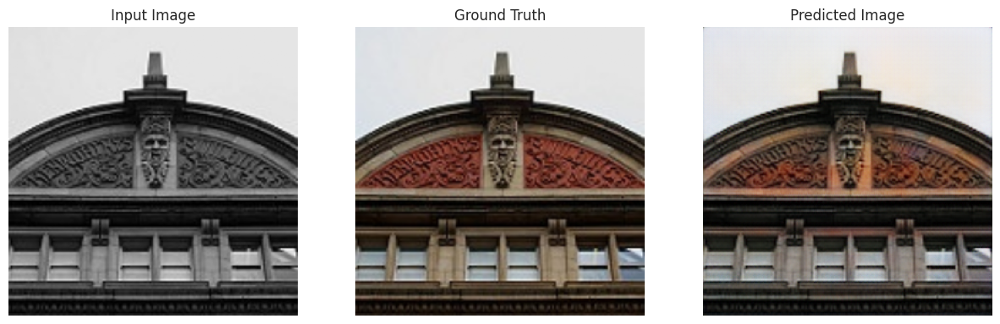

(64, 256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


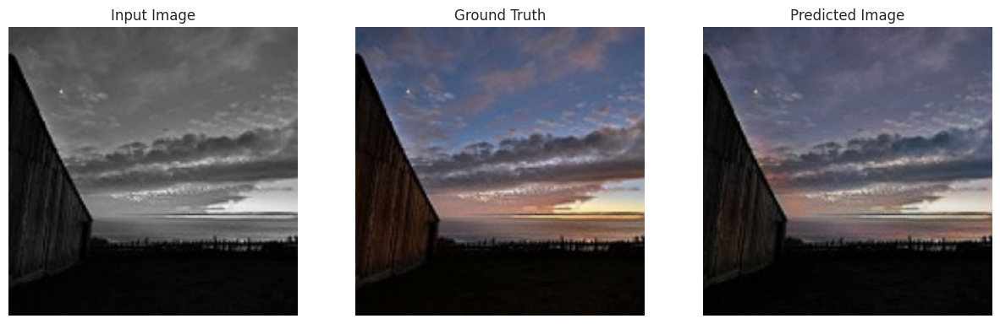

(64, 256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


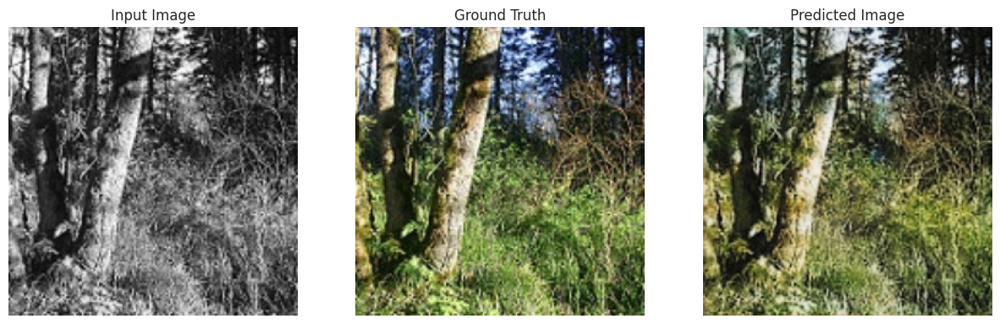

(64, 256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


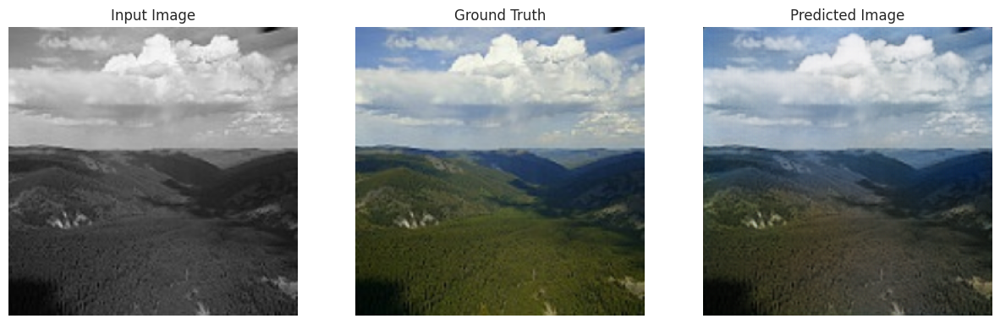

(64, 256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


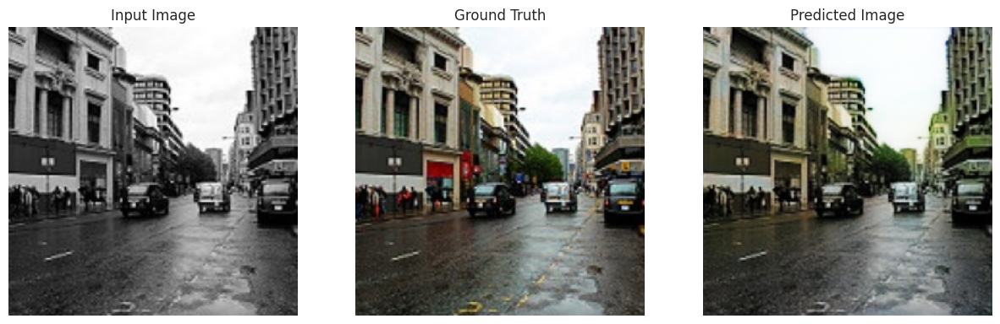

(64, 256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


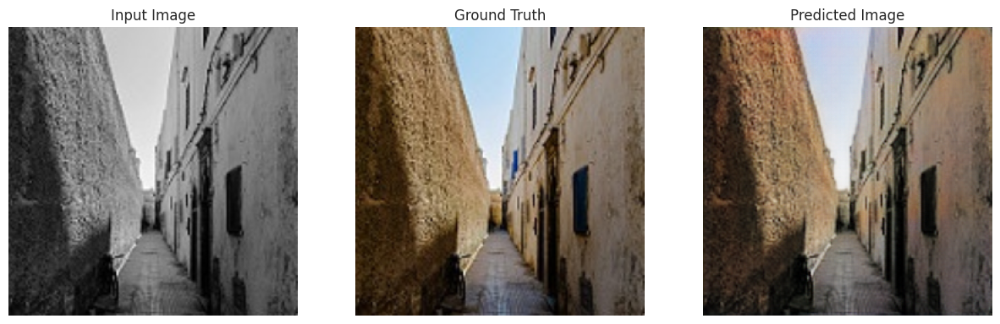

(64, 256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


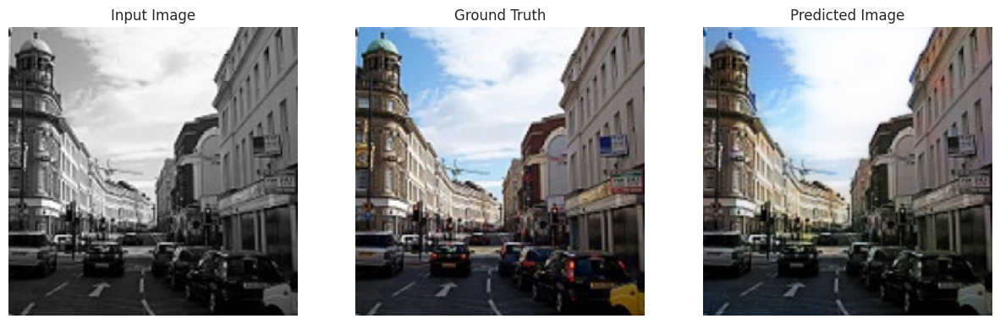

(64, 256, 256, 3)


In [87]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15,15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    print(test_input[0].shape)
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i])
    plt.axis('off')
  plt.show()

for example_input, example_target in tf.data.Dataset.zip((gray_dataset,color_dataset)).take(11):
  generate_images(generator, example_input, example_target)
  print(example_input.shape)

In [59]:
import os
import cv2
SIZE = 256

In [60]:
os.mkdir('/kaggle/working/outputs')

In [61]:
from PIL import Image

# Trying on new image out of Datasets

In [124]:
img2 = cv2.imread("/kaggle/input/landscape-image-colorization/landscape Images/gray/6905.jpg").astype("float32")
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

try:
    img2 = img2.reshape(1,SIZE,SIZE,3)
except:
    img2 = cv2.resize(img2,(SIZE,SIZE))
    img2 = img2.reshape(1,SIZE,SIZE,3)
img2[0] = img2[0]/255.0

[[[[0.9529412  0.9529412  0.9529412 ]
   [0.9514553  0.9514553  0.9514553 ]
   [0.9491575  0.9491575  0.9491575 ]
   ...
   [0.96064645 0.96064645 0.96064645]
   [0.95834863 0.95834863 0.95834863]
   [0.95686275 0.95686275 0.95686275]]

  [[0.9529412  0.9529412  0.9529412 ]
   [0.9514553  0.9514553  0.9514553 ]
   [0.9491575  0.9491575  0.9491575 ]
   ...
   [0.96069866 0.96069866 0.96069866]
   [0.95927155 0.95927155 0.95927155]
   [0.95834863 0.95834863 0.95834863]]

  [[0.9529412  0.9529412  0.9529412 ]
   [0.9514553  0.9514553  0.9514553 ]
   [0.9491575  0.9491575  0.9491575 ]
   ...
   [0.9607795  0.9607795  0.9607795 ]
   [0.96069866 0.96069866 0.96069866]
   [0.96064645 0.96064645 0.96064645]]

  ...

  [[0.9451593  0.9451593  0.9451593 ]
   [0.85098416 0.85098416 0.85098416]
   [0.7053525  0.7053525  0.7053525 ]
   ...
   [0.9506556  0.9506556  0.9506556 ]
   [0.8987757  0.8987757  0.8987757 ]
   [0.8652267  0.8652267  0.8652267 ]]

  [[0.88082105 0.88082105 0.88082105]
   [0.8

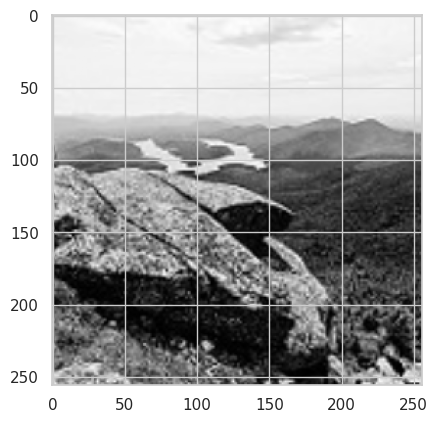

In [125]:
print(img2)
print(img2.shape)
plt.imshow(img2[0])

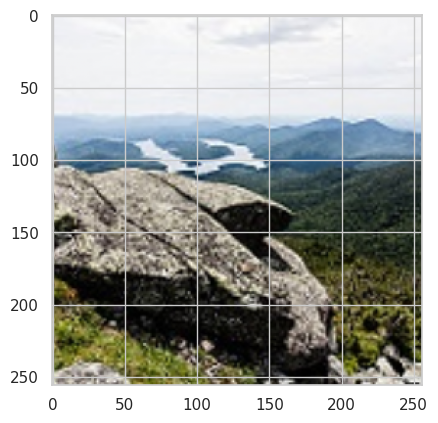

In [126]:
img3 = cv2.imread("/kaggle/input/landscape-image-colorization/landscape Images/color/6905.jpg")
# open cv reads images in BGR format so we have to convert it to RGB
img3 = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)
img2 = img2.reshape(1,SIZE,SIZE,3)
img3 = cv2.resize(img3, (256, 256))
img3 = img3 / 255.0
plt.imshow(img3)


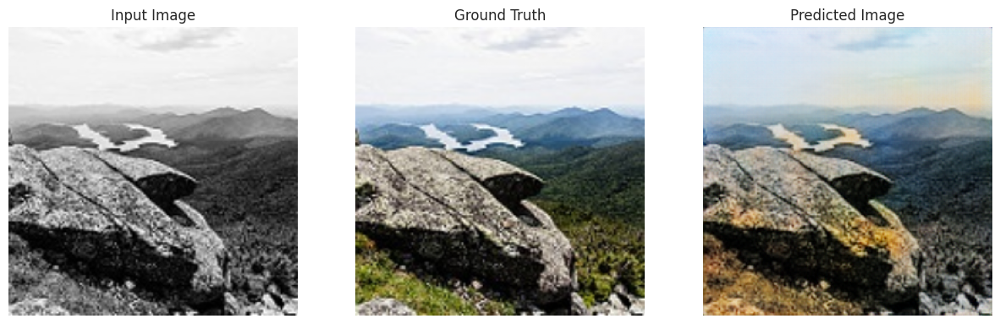

In [127]:
prediction = generator(img2, training = True)

plt.figure(figsize=(15,15))

display_list = [img2[0], img3, prediction[0]]
title = ['Input Image', 'Ground Truth', 'Predicted Image']

for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i])
    plt.axis('off')
plt.show()


This is the image after Colorizing

# Performance

## Pixel Mean Squared Error

Text(0.5, 0.98, 'MSE: 0.005278288346705543')

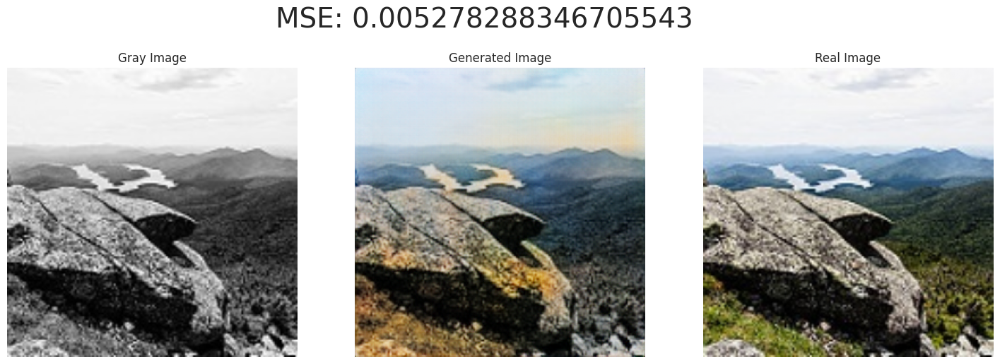

In [128]:
generated_color_image = np.squeeze(prediction)
# Calculate MSE between generated and real images
mse = np.mean((generated_color_image - img3) ** 2)

# Display generated and real images along with MSE
plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.title('Gray Image')
plt.imshow(img2[0])
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Generated Image')
plt.imshow(generated_color_image)
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Real Image')
plt.imshow(img3)
plt.axis('off')

plt.suptitle(f'MSE: {mse}', fontsize=28)

In [130]:
# Define a function to calculate MSE for a dataset
def calculate_mse(gray_dataset, color_dataset):
    total_mse = 0
    total_samples = 0
    for gray_images, real_images in zip(gray_dataset, color_dataset):
        # Generate color images for the grayscale images
        generated_color_images = np.squeeze(generator(img2, training = True))

        # Calculate MSE for the batch
        batch_mse = np.mean((generated_color_images - real_images) ** 2)
        
        # Update total MSE and total number of samples
        total_mse += batch_mse * gray_images.shape[0]
        total_samples += gray_images.shape[0]
    
    # Calculate average MSE
    avg_mse = total_mse / total_samples
    return avg_mse

# Calculate MSE for test datasets
test_mse = calculate_mse(gray_dataset_t, color_dataset_t)
print("MSE for test dataset:", test_mse)

MSE for test dataset: 0.11814857423305511


## Fréchet Inception Distance (FID)

In [149]:

import tensorflow as tf
import numpy as np
import tensorflow_datasets as tfds
import tensorflow_probability as tfp
from scipy import linalg

# Load Inception-v3 model
inception_model = tf.keras.applications.InceptionV3(include_top=False, pooling='avg', weights='imagenet')

# Function to preprocess images for Inception-v3 model
def preprocess_image(image):
    image = tf.image.resize(image, (299, 299))
    image = tf.keras.applications.inception_v3.preprocess_input(image)
    return image

# Function to calculate Inception-v3 activations
def calculate_inception_activations(images):
    processed_images = np.array([preprocess_image(image) for image in images])
    activations = inception_model.predict(processed_images)
    return activations

# Function to calculate FID score between a set of generated images and real images
def calculate_fid_score(real_images, generated_images):
    mu_real = np.mean(calculate_inception_activations(real_images), axis=0)
    sigma_real = np.cov(calculate_inception_activations(real_images), rowvar=False)

    mu_fake = np.mean(calculate_inception_activations(generated_images), axis=0)
    sigma_fake = np.cov(calculate_inception_activations(generated_images), rowvar=False)

    # Ensure the covariance matrices have the same shape
    if sigma_real.shape != sigma_fake.shape:
        sigma_real = sigma_real[:min(sigma_real.shape[0], sigma_fake.shape[0]), :min(sigma_real.shape[1], sigma_fake.shape[1])]
        sigma_fake = sigma_fake[:min(sigma_real.shape[0], sigma_fake.shape[0]), :min(sigma_real.shape[1], sigma_fake.shape[1])]

    # Calculate squared Frobenius norm between means
    mu_diff = mu_real - mu_fake
    mu_diff_squared = np.dot(mu_diff, mu_diff)

    # Calculate trace of sigma_real + sigma_fake - 2*sqrt(sigma_real * sigma_fake)
    sigma_diff = linalg.sqrtm(sigma_real @ sigma_fake)  # Matrix multiplication instead of np.dot
    trace = np.trace(sigma_real + sigma_fake - 2 * sigma_diff)

    # Calculate FID score
    fid_score = mu_diff_squared + trace
    return fid_score

# Example usage
generated_images = []
for img in gray_img:
    generated_color_image = generator(np.expand_dims(img, axis=0), training=True)
    generated_images.append(np.squeeze(generated_color_image))

generated_images = np.array(generated_images)
color_images = np.array(color_img[2000:])
fid_score = calculate_fid_score(color_images, generated_images)
print("FID Score:", fid_score.real)

69/69 [==============================] - 4s 62ms/step
FID Score: 0.6312372053669082


# Saving and Load Model

In [150]:
model_Generator_json=generator.to_json()
model_discriminator_json=discriminator.to_json()


In [151]:
with open('modelGenerator.json','w') as json_file:
  json_file.write(model_Generator_json)
generator.save_weights('modelGen.h5')
print('saved model to disk')


saved model to disk


In [152]:
with open('modelDescriminator.json','w') as json_file:
  json_file.write(model_discriminator_json)
generator.save_weights('modelDis.h5')
print('saved model  Dis to disk')

saved model  Dis to disk


In [153]:
from tensorflow.keras.models import model_from_json
json_file = open('modelGenerator.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)
loaded_model.load_weights("modelGen.h5")
print("Loaded model from disk")

loaded_model.compile(loss='binary_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

Loaded model from disk


# Deployment

We Use to Deploy our model **Streamlit** and **Flask**